<h1><center>LEVERAGING MACHINE LEARNING TO CLASSIFY fMRI IMAGES</center></h1>

# Background

Some argue that no element of a person's `mental life` is as fundamental and significant as their emotions. `Emotion states` provide `behavioral`, `biological`, and `psychological` interest due to their variation by culture and individual. Understanding how previous circumstances and conditions can impact the way a person experiences and feels an `emotion` will aid us in understanding `human behavior` and the `philosophy of emotions`.

My primary goal of this project is to understand ways `machine learning` and `data visualizations` can enhance our ability to use neuroimaging data to answer important questions pertaining to human neuroscience, psychology and behavior.

# Introduction and Description of the Data


### About this Dataset

The brain data files I used are from Northeastern University’s Affective and Brain Sciences Lab and were preprocessed three-dimensional beta maps where the value at each voxel is representative of the participant’s level of brain activity during this task. For the research itself, thirty participants were placed in a functional Magnetic Resonance Imaging (fMRI) scanner and shown images that elicit anger, fear, or disgust after being primed with congruent, incongruent, or neutral emotion words. Congruent emotion words are words that are consistent emotionally to the image shown; being primed with an angry word and shown an angry image is considered congruent priming. Being shown a fearful word and then disgusting image is considered incongruent priming. And being shown a neutral word and a fearful image is considered neutral priming. 


### What Research Questions I Am Investigating

For this project I will be answering the following questions:

* Which emotion state (anger, fear, disgust) can be most accurately predicted across the different priming conditions, parcellation techniques and classifiers ? 
* How does the priming condition affect the accuracy of our classifiers? 
* What classifier will have the highest prediction accuracy?
* How does parcellation technique affect the accuracy of our classifiers?

To tackle these questions I will be separating the data by priming condition (turning 1 dataset of 270 brain images to 3 datasets of 90) and building multiple algorithms to classify this data. The NiLearn library has datasets that contain brain maps or outlined regions of the brain that group voxels together based on similar brain function. Applying each of these atlas maps as a mask on the brain file images will condense the numpy array that represents each voxel. Based on the classifier performance for each parcellation technique I can see how results vary.


### What Impact This Investigation Has

Studying `functional magnetic resonance imaging`, 4-dimensional brain scans that reflect brain activiation of specific areas through changes in blood flow, can be used to view and analyze the brain under different `emotion states`. Taking into context pre-emotional stimulation will us to see how one's brain's registration of an emotion varies based on the previous emotion state of the person and what machine learning algorithm and parcellation method is best to use when classifying human emotions. Done correctly, we could understand exactly what brain regions play the biggest role in emotion differentiation and what algorithms are best used to detect this differentiation.

# Visualizations

Visualizations allow us to familiarize ourselves with the data. I will be creating the following visualizations:
* ROI/mask image
* Mean images for each priming condition, emotion state and 3 test subjects
* ROI/probabilistic atlas image of each parcellation atlas

In [1283]:
from functions import *

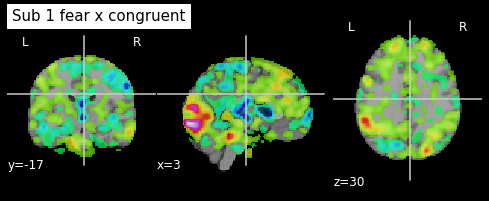

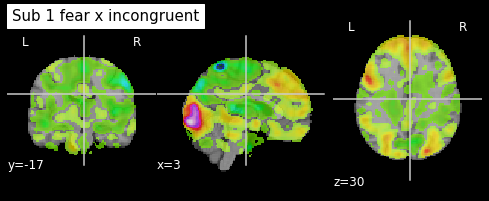

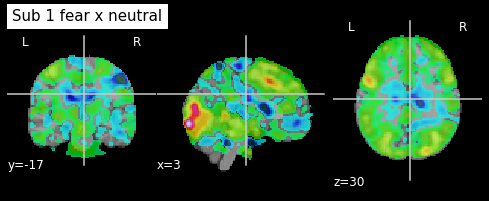

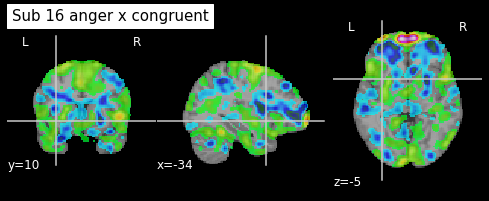

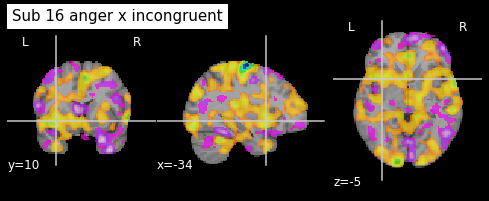

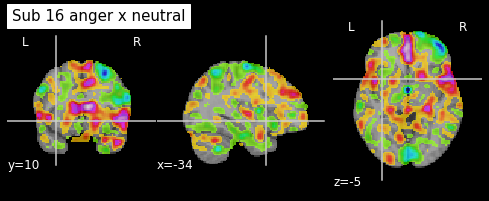

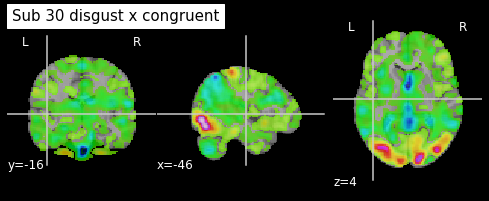

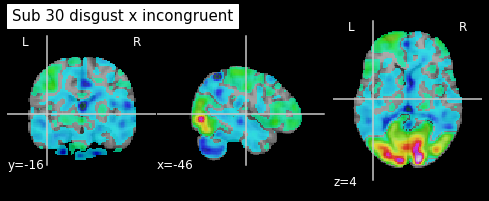

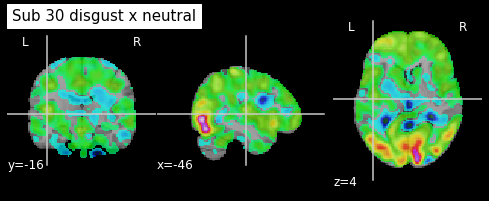

In [1055]:
# plot 3 participants' brains experiencing anger, fear and disgust
plot_sub_emotion(1, 'fear', coordinates = (3,-17,30))
plot_sub_emotion(16, 'anger', coordinates = (-34, 10, -5))
plot_sub_emotion(30, 'disgust', coordinates = (-46, -16, 4))

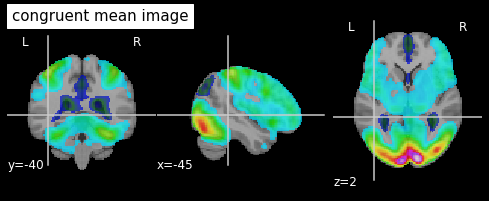

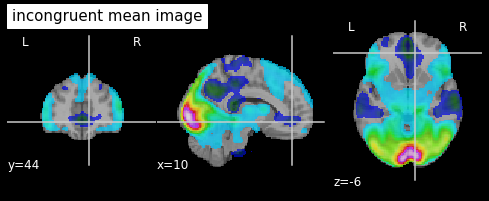

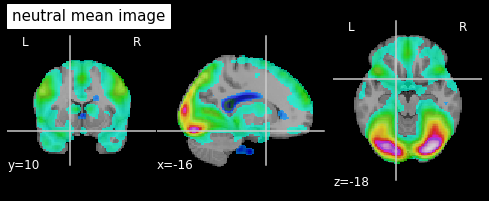

In [1063]:
plot_mean_imgs('priming', 'congruent', (-45, -40, 2))
plot_mean_imgs('priming', 'incongruent', (10, 44, -6))
plot_mean_imgs('priming', 'neutral', (-16, 10, -18))

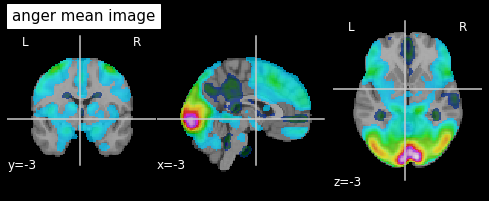

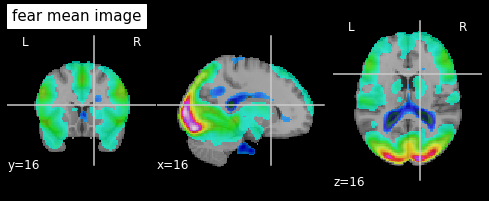

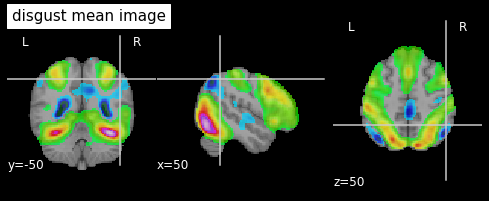

In [1064]:
plot_mean_imgs('emotion', 'anger', (-3, -3, -3))
plot_mean_imgs('emotion', 'fear', (16, 16, 16))
plot_mean_imgs('emotion', 'disgust', (50, -50, 50))

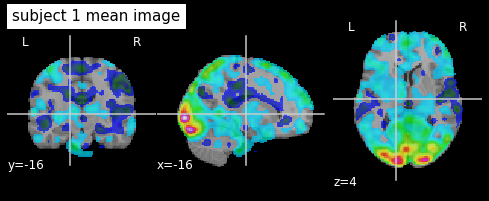

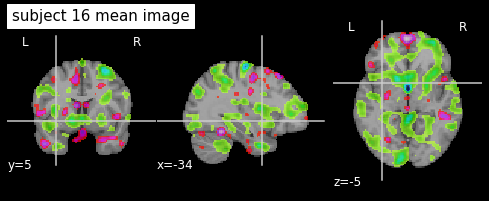

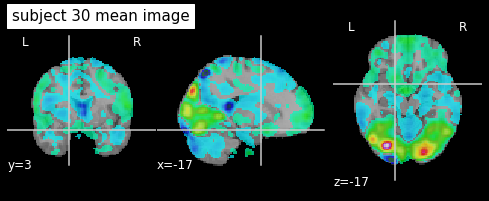

In [1226]:
# plot average image for 3 participants
plot_mean_imgs('subject', 1, (-16, -16, 4))
plot_mean_imgs('subject', 16, (-34, 5, -5))
plot_mean_imgs('subject', 30, (-17,3, -17))

In [1275]:
# create dict and list of all parcellation atlases
atlas_types = parcellation_atlas_dict()
atlases = list(atlas_types.keys())

/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/numpy/lib/npyio.py:2407: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  output = genfromtxt(fname, **kwargs)
/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/numpy/lib/npyio.py:2407: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  output = genfromtxt(fname, **kwargs)


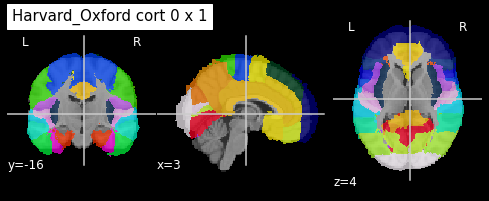

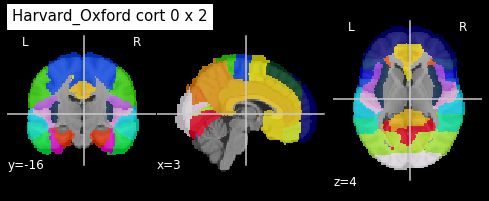

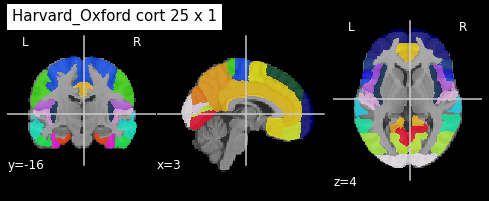

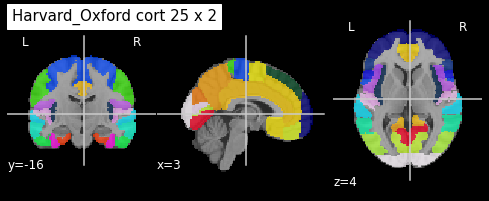

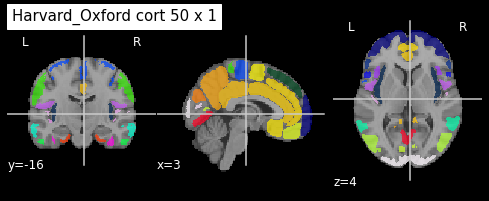

...

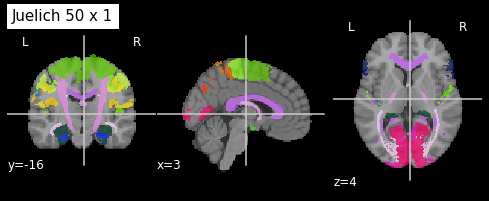

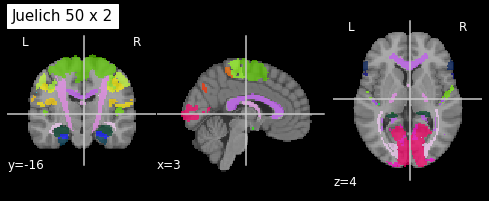

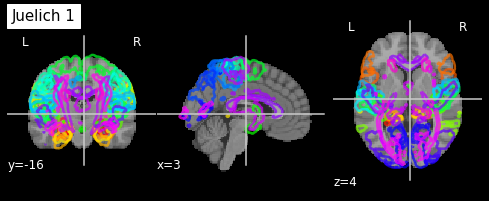

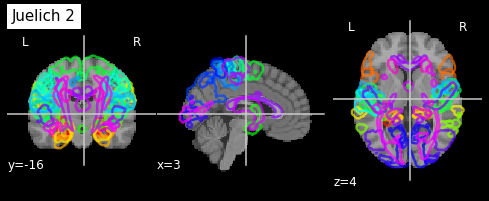

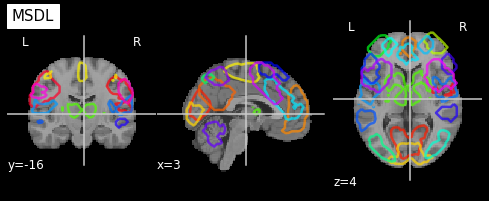

/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2829: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


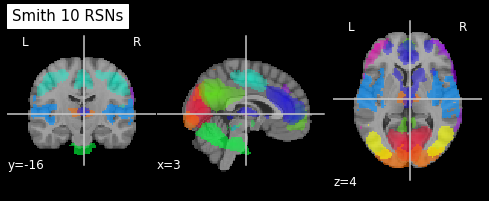

/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays.py:101: UserWarning: linewidths is ignored by contourf
  im = getattr(ax, type)(data_2d.copy(),


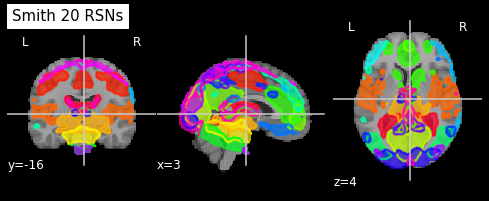

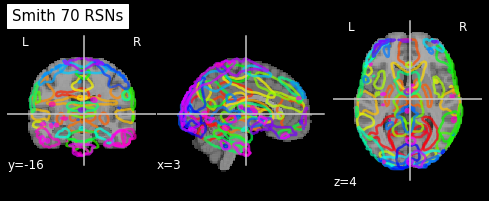

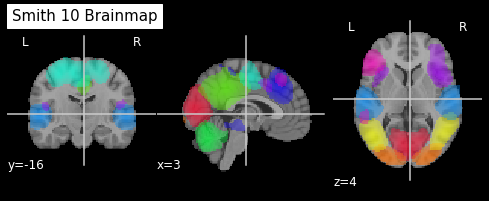

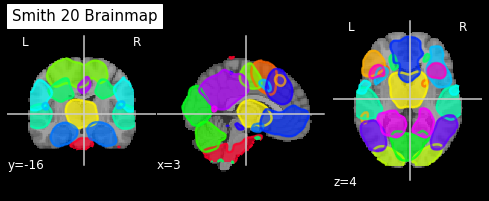

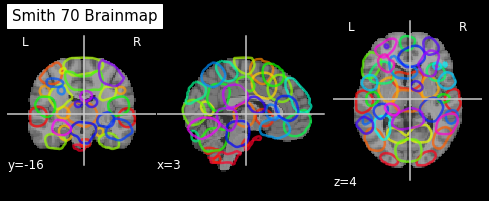

...

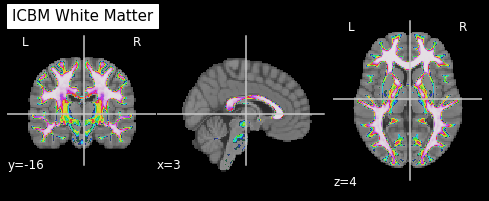

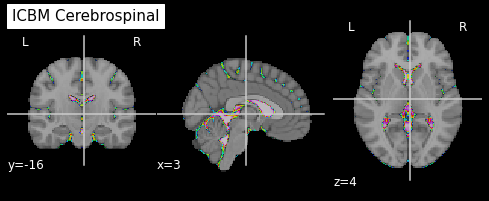

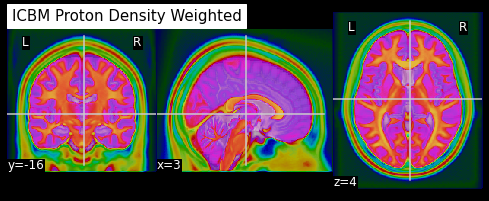

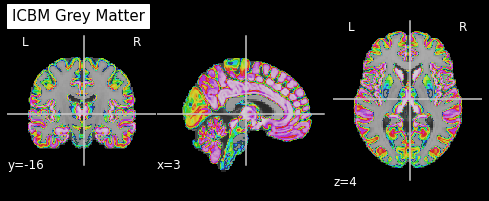

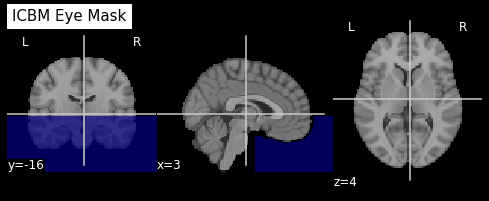

/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2829: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


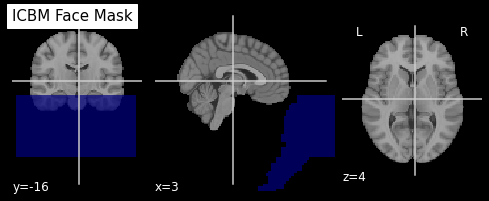

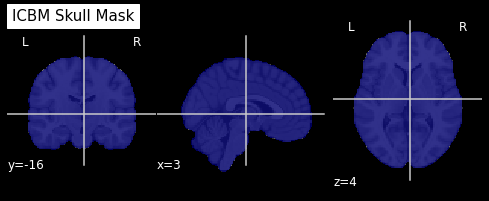

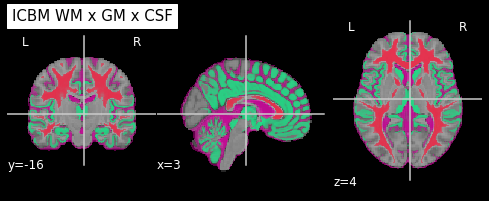

/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays.py:101: UserWarning: No contour levels were found within the data range.
  im = getattr(ax, type)(data_2d.copy(),


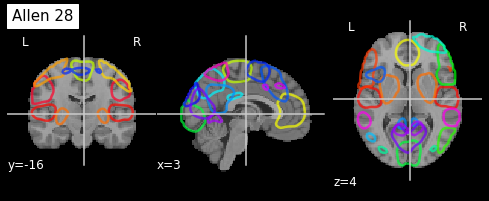

/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays.py:101: UserWarning: No contour levels were found within the data range.
  im = getattr(ax, type)(data_2d.copy(),


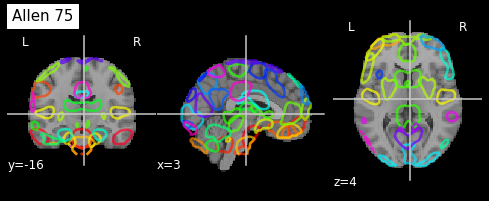

/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/numpy/ma/core.py:2829: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/Users/anandafrancis/opt/anaconda3/lib/python3.8/site-packages/nilearn/plotting/displays.py:101: UserWarning: linewidths is ignored by contourf
  im = getattr(ax, type)(data_2d.copy(),


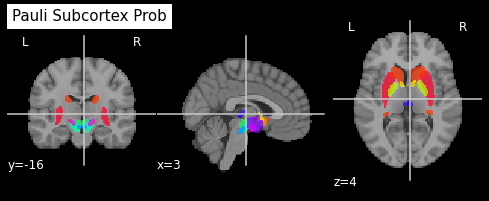

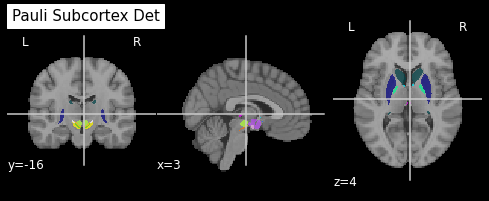

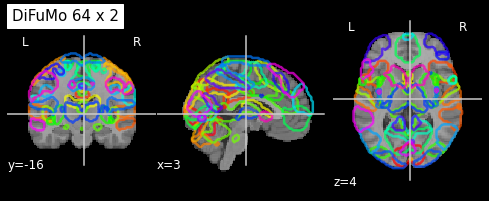

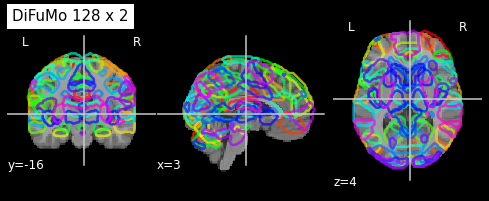

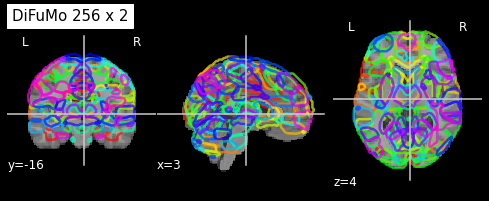

...

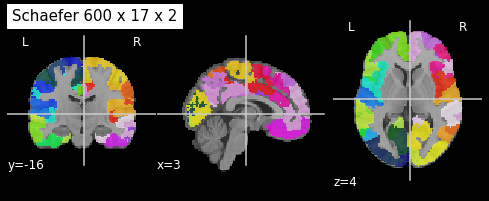

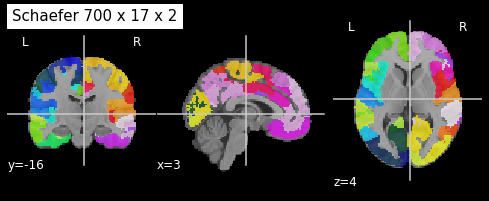

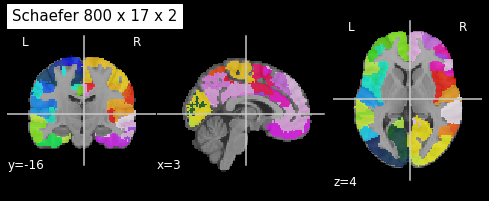

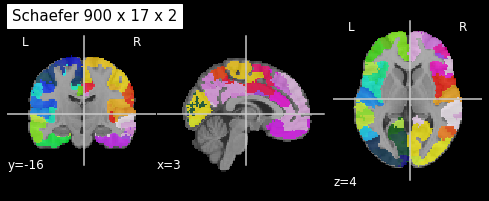

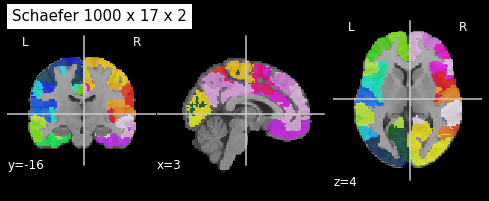

In [1228]:
# plot visualization for each parcellation atlas
for atlas in atlases:
    plot_parcellation_map(atlas, atlas_types, (3, -16, 4))

In [ ]:
data_df = pd.read_csv('brain_data.csv')
standardized_df = pd.read_csv('train_test_data.csv')
testing_df = pd.read_csv('testing_data.csv')

## Present All DataFrames

In [1292]:
data_df

,filename,emotion,priming,aal_spm12,allen_28,allen_75,difumo_64_2,difumo_64_3,difumo_128_2,difumo_128_3,...,smith_20_brainmap,smith_70_brainmap,smith_10_rsn,smith_20_rsn,smith_70_rsn,talairach_ba,talairach_gyrus,talairach_hemi,talairach_lobe,talairach_tissue
0,cp001_beta_anger_congruent_c0.nii.gz,anger,congruent,[3.421537715899873e-05],"[0.009483780636358428, 0.01644603633560918, -0...","[0.025596078987764604, -0.0026078368966968037,...","[-1262.4979468740887, 1087.3604628371738, -126...","[-1409.8252663117753, 1127.4561789786987, -124...","[-3072.279909526853, 979.4084898514106, -2053....","[-3020.470566655783, 941.7110183966394, -1858....",...,"[0.05395198432668631, -0.09481341156832737, 0....","[0.038196988466737636, 0.05467146396055735, 0....","[0.025987957085848945, 0.05727044120693561, -0...","[0.14606950199270466, 0.19769191010595233, 0.1...","[-0.0031882049394257386, -0.037689043035413046...",[0.0037902316275143285],[0.0076464044291770245],[0.048523923820371614],[0.027612794719616036],[0.15250149201348623]
1,cp001_beta_anger_incongruent_c0.nii.gz,anger,incongruent,[6.466449707503177e-05],"[-0.004149065445312702, 0.0013010547164134612,...","[0.00504961514247687, -0.0075762092488012465, ...","[1132.1473019907733, 3010.6055840689196, 6733....","[1036.8490601091364, 3085.15534903414, 6533.19...","[31.109289833652156, 56.275210603990814, -575....","[-4.893865494275445, 15.905448841395895, -397....",...,"[0.032323523571503476, -0.04134232305416398, 0...","[0.06314756377201002, 0.21180721170683225, 0.0...","[0.1562900715051604, 0.3346482035027357, 0.045...","[-0.07584679413115429, -0.0408410074965227, -0...","[0.08741441700061556, 0.04425808237145672, 0.0...",[0.005620252385226289],[0.010429446439438658],[0.06483410102078592],[0.051698998949291336],[0.18303113758027453]
2,cp001_beta_anger_neutral_c0.nii.gz,anger,neutral,[0.00012201990699404458],"[-0.007375861707890696, -0.01222270612933317, ...","[0.01786731871175145, -0.0009169388298047045, ...","[5890.016229238548, 2998.3245162123967, 3725.4...","[6019.653523201957, 3196.4571467235946, 3611.2...","[2265.0753435175952, -477.3545605710774, 1724....","[2179.11190808209, -433.72315996735915, 1848.5...",...,"[-0.010352927193884615, -0.021160319233586522,...","[0.03888530064302741, 0.2384168300734022, -0.0...","[-0.03373042996841251, 0.37259889659307716, 0....","[-0.05404499231657587, -0.19679170253735115, -...","[0.017332910946005274, 0.03709054688269234, 0....",[0.014479237424816875],[0.020065599074268078],[0.14065213898024345],[0.10341524434656617],[0.43786075619006315]
3,cp001_beta_disgust_congruent_c0.nii.gz,disgust,congruent,[-5.240212740121489e-06],"[-0.01822926776086834, -0.00914906323677287, -...","[0.01271374922549266, -0.00826823662244076, -0...","[236.07683476634378, 701.8484295151637, 3748.4...","[211.41771757791764, 711.3252402479651, 3699.6...","[-1941.4620731105927, -3097.666871841392, 582....","[-1901.5263813055738, -3127.791504691578, 690....",...,"[0.03467945425654567, -0.020237650152835362, -...","[0.08466645441504611, 0.15953445805426195, -0....","[0.12264663188029398, 0.22007183447060819, 0.0...","[0.015087739848758747, -0.1907813002247535, -0...","[0.10143917816369608, 0.020078322246022375, 0....",[-0.009668910233689862],[-0.005892465527489794],[-0.030203096296419686],[-0.019081632640995654],[-0.0752354454528796]
4,cp001_beta_disgust_incongruent_c0.nii.gz,disgust,incongruent,[-6.100933993629765e-05],"[-0.023799161286428172, -0.01016355806908962, ...","[0.0069304567798876195, -0.005293827918232894,...","[-1376.2951112538192, -129.79676877801296, 628...","[-1482.614001213165, -34.971125134640374, 6066...","[-480.38498928944085, -2043.6711977687232, -4....","[-457.930599266547, -2089.9729138456983, 146.2...",...,"[-0.012829138112092013, -0.018795250677216373,...","[0.07809184156818592, 0.25870793187213986, -0....","[0.055438086448527074, 0.35651020075093715, 0....","[-0.025256400880867155, -0.22687536601003264, ...","[0.057849550523582094, 0.041253288771783844

In [1069]:
standardized_df

,priming,parcellation,X,y,X_train,X_test,y_train,y_test
0,congruent,aal_spm12,"[[0.19516454489959473], [-0.06514195471815547]...","[anger, disgust, fear, anger, disgust, fear, a...","[[-0.39179858290496616], [0.12477416873891177]...","[[0.9314971193590198], [-0.26653015053374046],...","[disgust, disgust, anger, disgust, fear, anger...","[disgust, anger, fear, fear, disgust, anger, f..."
1,congruent,allen_28,"[[0.4786489365179667, 1.1154569800118563, -0.8...","[anger, disgust, fear, anger, disgust, fear, a...","[[0.72025775476584, 0.15596088013352782, 1.258...","[[2.273319906484417, 2.6010741373536623, 1.873...","[disgust, anger, fear, fear, disgust, fear, an...","[anger, anger, fear, anger, anger, anger, fear..."
2,congruent,allen_75,"[[1.4708957065266575, -0.2655574099052094, -0....","[anger, disgust, fear, anger, disgust, fear, a...","[[-0.866163626514769, 0.6537589514683443, -2.6...","[[0.35108007328178403, -0.650160719274253, -0....","[fear, anger, fear, fear, anger, anger, fear, ...","[disgust, fear, disgust, disgust, anger, disgu..."
3,congruent,difumo_64_2,"[[-0.39404286353523016, 0.24390645610038061, 0...","[anger, disgust, fear, anger, disgust, fear, a...","[[-1.4211356099480712, -0.34516980961249366, -...","[[-0.934560781520193, -0.9142972730885164, -1....","[fear, anger, disgust, fear, fear, anger, disg...","[fear, disgust, fear, disgust, anger, anger, d..."
4,congruent,difumo_64_3,"[[-0.4262876630533028, 0.2487589217590755, 0.0...","[anger, disgust, fear, anger, disgust, fear, a...","[[-0.12897958837081147, -0.30209211581876283, ...","[[-1.1197874040360696, -0.0509148933233805, 0....","[disgust, disgust, disgust, disgust, disgust, ...","[anger, anger, disgust, fear, disgust, fear, f..."
...,...,...,...,...,...,...,...,...
325,neutral,talairach_ba,"[[0.42361048839528936], [-0.05355161901982164]...","[anger, disgust, fear, anger, disgust, fear, a...","[[0.7467727803618475], [0.42361048839528936], ...","[[-0.15106356829422715], [0.631414301840107], ...","[disgust, fear, anger, fear, fear, anger, ange...","[anger, fear, anger, fear, fear, disgust, fear..."
326,neutral,talairach_gyrus,"[[0.555245805177425], [-0.009104470149446046],...","[anger, disgust, fear, anger, disgust, fear, a...","[[-0.08209766054603013], [0.5320622544848682],...","[[-0.025951791952156446], [0.12048697678165439...","[fear, anger, fear, disgust, anger, anger, fea...","[anger, fear, anger, disgust, fear, disgust, d..."
327,neutral,talairach_hemi,"[[0.5927147946066714], [0.025105584712746695],...","[anger, disgust, fear, anger, disgust, fear, a...","[[-0.32466190824681007], [0.47969842216442665]...","[[-2.1406321023198527], [-0.3993316489052203],...","[fear, anger, fear, disgust, anger, fear, disg...","[anger, anger, fear, disgust, fear, anger, fea..."
328,neutral,talairach_lobe,"[[0.615358224522046], [0.013404559825177118], ...","[anger, disgust, fear, anger, disgust, fear, a...","[[0.07079746413952294], [1.0822832636986108], ...","[[0.8282456365376785], [1.1704181839361338], [...","[fear, anger, disgust, disgust, fear, anger, f...","[disgust, fear, disgust, anger, anger, anger, ..."


In [1044]:
testing_df

,priming,parcellation,algorithm,predicted,actual,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
0,congruent,aal_spm12,SVC,"[fear, anger, fear, fear, disgust, anger, ange...","[disgust, anger, fear, fear, disgust, anger, f...",0.461376,0.500000,0.571429,0.285714,0.533333,0.800000,0.571429,0.166667
1,congruent,aal_spm12,NuSVC,"[fear, anger, fear, fear, disgust, disgust, di...","[disgust, anger, fear, fear, disgust, anger, f...",0.376374,0.388889,0.285714,0.307692,0.500000,0.200000,0.571429,0.333333
2,congruent,aal_spm12,LinearSVC,"[anger, disgust, fear, anger, disgust, anger, ...","[disgust, anger, fear, fear, disgust, anger, f...",0.279948,0.277778,0.142857,0.461538,0.222222,0.200000,0.142857,0.500000
3,congruent,aal_spm12,SGD,"[disgust, disgust, disgust, disgust, disgust, ...","[disgust, anger, fear, fear, disgust, anger, f...",0.166667,0.333333,0.000000,0.500000,0.000000,0.000000,0.000000,1.000000
4,congruent,aal_spm12,KNN,"[fear, disgust, anger, disgust, disgust, disgu...","[disgust, anger, fear, fear, disgust, anger, f...",0.407143,0.444444,0.500000,0.571429,0.200000,0.600000,0.142857,0.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10555,neutral,talairach_tissue,knn_rogerstanimoto,"[anger, fear, anger, anger, fear, fear, fear, ...","[anger, disgust, fear, anger, disgust, fear, a...",0.421832,0.422222,0.421053,0.444444,0.400000,0.400000,0.400000,0.466667
10556,neutral,talairach_tissue,knn_russellrao,"[disgust, disgust, disgust, disgust, disgust, ...","[anger, disgust, fear, anger, disgust, fear, a...",0.239286,0.300000,0.342857,0.375000,0.000000,0.400000,0.000000,0.500000
10557,neutral,talairach_tissue,knn_sokalmichener,"[anger, fear, anger, anger, fear, fear, fear, ...","[anger, disgust, fear, anger, disgust, fear, a...",0.421832,0.422222,0.421053,0.444444,0.400000,0.400000,0.400000,0.466667
10558,neutral,talairach_tissue,knn_sokalsneath,"[anger, disgust, anger, anger, disgust, disgus...","[anger, disgust, fear, anger, disgust, fear, a...",0.306710,0.322222,0.254545,0.415584,0.250000,0.233333,0.200000,0.533333


# Research Answers

## Best Results

**Of the emotion states**:
* `Anger` had the highest `average f1 score` of `0.387289` and `average accuracy` of `0.444459`.

**Of the priming conditions**:
* `Congruent priming` had the highest `overall f1 score`, `overall accuracy`, `average disgust f1 score`, `average fear f1 score`, `average fear accuracy` and `average disgust accuracy`. 
* `Neutral priming` has highest `average anger f1 score` and `average anger accuracy`.

**Of the parcellation techniques**:
* `Pauli Subcortex Prob atlas` had the best `overall f1 score`.
* `Harvard Oxford Cort 25 x 1 atlas` had the best `overall accuracy`.
* `ICBM T1 Weighted atlas` had the best `average anger f1 score`.
* `ICBM White Matter x Grey Matter x Cerebrospinal atlas` had the best `average disgust f1 score`.
* `Harvard Oxford Sub 1 atlas` had the highest `average fear f1 score` and `average fear accuracy`.
* `ICBM Grey Matter atlas` had the best `average anger accuracy`. 
* `Pauli Subcortex Det atlas` had the highest `average disgust accuracy`.

**Of the classifiers**:
* My `KNN` built from scratch using `hamming distance` function and `jaccard distance` function had the highest `overall f1 score`, `overall accuracy`, `average anger f1 score`, `average disgust f1 score`, `average fear f1 score`, `average anger accuracy`, `average disgust accuracy` & `average fear accuracy`.

## Worst Resutls
**Of the emotion states**:
* `Fear` had the lowest `average f1 score` of `0.368467` and `average accuracy` of `0.391656`.

**Of the priming conditions**:
* `Incongruent priming` had the lowest `overall f1 score`, `overall accuracy`, `average anger f1 score`, and `average fear accuracy`  
* `Neutral priming` had the lowest `average disgust f1 score`, `average fear f1 score` and `average disgust accuracy`.
* `Congruent priming` had the lowest `average anger accuracy`.

**Of the parcellation techniques**:
* `Difumo 512 x 3 atlas` had the lowest `overall f1 score` and `overall accuracy`.
* `Schaefer 400 x 7 x 1 atlas` had the lowest `average anger f1 score`.
* `Schaefer 700 x 7 x 2 atlas` had the lowest `average disgust f1 score` and `average disgust accuracy`.
* `ICBM T-1 Weighted atlas` had the lowest `average fear f1 score` and `average fear accuracy`.
* `MSDL atlas` had the lowest `average anger accuracy`.

**Of the classifiers**:
* My `KNN` using `jensenshannon distance` function had the lowest `overall f1 score`
* My `KNN` using `cosine_similarity` function had the lowest `overall accuracy`.
* My `KNN` using `rogerstanimoto` function and `sokalmichener` function had the lowest `average anger f1 score` and `average anger accuracy`.
* My `KNN` using `jensenshannon` function had the lowest `average disgust f1 score`, `average fear f1 score`, `average disgust accuracy`, and `average fear accuracy`.


## Results DataFrames

In [1006]:
priming_results = testing_df.groupby('priming').mean()
parcellation_results = testing_df.groupby('parcellation').mean()
classifier_results = testing_df.groupby('algorithm').mean()

In [1046]:
testing_df.mean()

/var/folders/gd/vj6nrxx1037dp6b1bqg_hg3c0000gn/T/ipykernel_13583/520297405.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  testing_df.mean()


f1                  0.385081
accuracy            0.423465
anger_f1            0.387289
disgust_f1          0.383349
fear_f1             0.368467
anger_accuracy      0.444459
fear_accuracy       0.391656
disgust_accuracy    0.433615
dtype: float64

In [1014]:
priming_results

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
priming,,,,,,,,
congruent,0.395616,0.432743,0.373992,0.412143,0.381020,0.408657,0.407089,0.476584
incongruent,0.379253,0.416720,0.370615,0.380763,0.374141,0.415837,0.405619,0.432360
neutral,0.380372,0.420931,0.417260,0.357139,0.350241,0.508882,0.362261,0.391900


In [1021]:
parcellation_results[parcellation_results.f1 == parcellation_results.f1.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
pauli_subcortex_prob,0.43509,0.443287,0.405786,0.452852,0.427796,0.450694,0.418634,0.467956


In [1022]:
parcellation_results[parcellation_results.accuracy == parcellation_results.accuracy.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
harvard_oxford_cort_25_1,0.412582,0.46169,0.386723,0.429868,0.410166,0.426029,0.449752,0.501389


In [1023]:
parcellation_results[parcellation_results.anger_f1 == parcellation_results.anger_f1.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
icbm_t1_weighted,0.384361,0.434722,0.477394,0.372459,0.290379,0.598289,0.298611,0.410069


In [1024]:
parcellation_results[parcellation_results.disgust_f1 == parcellation_results.disgust_f1.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
icbm_wm_gm_csf,0.42036,0.438426,0.419601,0.466056,0.380154,0.473785,0.367969,0.502728


In [1025]:
parcellation_results[parcellation_results.fear_f1 == parcellation_results.fear_f1.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
harvard_oxford_sub_1,0.404594,0.42338,0.362069,0.368552,0.472584,0.379514,0.490836,0.398115


In [1026]:
parcellation_results[parcellation_results.anger_accuracy == parcellation_results.anger_accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
icbm_grey_matter,0.418307,0.459375,0.469162,0.433625,0.339159,0.599653,0.332837,0.454001


In [1027]:
parcellation_results[parcellation_results.fear_accuracy == parcellation_results.fear_accuracy.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
harvard_oxford_sub_1,0.404594,0.42338,0.362069,0.368552,0.472584,0.379514,0.490836,0.398115


In [1028]:
parcellation_results[parcellation_results.disgust_accuracy == parcellation_results.disgust_accuracy.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
pauli_subcortex_det,0.384692,0.437731,0.358062,0.429936,0.341859,0.384623,0.384722,0.522309


In [1031]:
classifier_results[classifier_results.f1 == classifier_results.f1.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_hamming,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667
knn_jaccard,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667


In [1032]:
classifier_results[classifier_results.accuracy == classifier_results.accuracy.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_hamming,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667
knn_jaccard,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667


In [1033]:
classifier_results[classifier_results.anger_f1 == classifier_results.anger_f1.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_hamming,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667
knn_jaccard,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667


In [1034]:
classifier_results[classifier_results.disgust_f1 == classifier_results.disgust_f1.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_hamming,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667
knn_jaccard,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667


In [1035]:
classifier_results[classifier_results.fear_f1 == classifier_results.fear_f1.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_hamming,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667
knn_jaccard,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667


In [1036]:
classifier_results[classifier_results.anger_accuracy == classifier_results.anger_accuracy.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_hamming,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667
knn_jaccard,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667


In [1037]:
classifier_results[classifier_results.fear_accuracy == classifier_results.fear_accuracy.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_hamming,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667
knn_jaccard,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667


In [1038]:
classifier_results[classifier_results.disgust_accuracy == classifier_results.disgust_accuracy.max()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_hamming,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667
knn_jaccard,0.977948,0.977778,0.967742,0.983051,0.983051,1.0,0.966667,0.966667


In [1229]:
parcellation_results[parcellation_results.f1 == parcellation_results.f1.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
difumo_512_3,0.345038,0.360069,0.338914,0.349195,0.343758,0.355804,0.339997,0.3875


In [1230]:
parcellation_results[parcellation_results.accuracy == parcellation_results.accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
difumo_512_3,0.345038,0.360069,0.338914,0.349195,0.343758,0.355804,0.339997,0.3875


In [1231]:
parcellation_results[parcellation_results.anger_f1 == parcellation_results.anger_f1.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
schaefer_400_7_1,0.352656,0.406597,0.321409,0.401915,0.326553,0.375,0.344271,0.503472


In [1232]:
parcellation_results[parcellation_results.disgust_f1 == parcellation_results.disgust_f1.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
schaefer_700_7_2,0.360776,0.408449,0.403466,0.302993,0.369626,0.494184,0.395089,0.33998


In [1233]:
parcellation_results[parcellation_results.fear_f1 == parcellation_results.fear_f1.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
icbm_t1_weighted,0.384361,0.434722,0.477394,0.372459,0.290379,0.598289,0.298611,0.410069


In [1234]:
parcellation_results[parcellation_results.anger_accuracy == parcellation_results.anger_accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
msdl,0.35838,0.371991,0.338696,0.392151,0.351088,0.341022,0.359028,0.424851


In [1235]:
parcellation_results[parcellation_results.fear_accuracy == parcellation_results.fear_accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
icbm_t1_weighted,0.384361,0.434722,0.477394,0.372459,0.290379,0.598289,0.298611,0.410069


In [1236]:
parcellation_results[parcellation_results.disgust_accuracy == parcellation_results.disgust_accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
parcellation,,,,,,,,
schaefer_700_7_2,0.360776,0.408449,0.403466,0.302993,0.369626,0.494184,0.395089,0.33998


In [1237]:
classifier_results[classifier_results.f1 == classifier_results.f1.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_jensenshannon,0.173271,0.336229,0.500601,0.010651,0.008562,0.995253,0.00596,0.007475


In [1238]:
classifier_results[classifier_results.accuracy == classifier_results.accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_cosine_similarity,0.237529,0.313704,0.296834,0.236422,0.179332,0.456263,0.204848,0.28


In [1239]:
classifier_results[classifier_results.anger_f1 == classifier_results.anger_f1.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_rogerstanimoto,0.196652,0.332323,0.155231,0.267374,0.167351,0.252323,0.264848,0.479798
knn_sokalmichener,0.196652,0.332323,0.155231,0.267374,0.167351,0.252323,0.264848,0.479798


In [1240]:
classifier_results[classifier_results.disgust_f1 == classifier_results.disgust_f1.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_jensenshannon,0.173271,0.336229,0.500601,0.010651,0.008562,0.995253,0.00596,0.007475


In [1241]:
classifier_results[classifier_results.fear_f1 == classifier_results.fear_f1.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_jensenshannon,0.173271,0.336229,0.500601,0.010651,0.008562,0.995253,0.00596,0.007475


In [1242]:
classifier_results[classifier_results.anger_accuracy == classifier_results.anger_accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_rogerstanimoto,0.196652,0.332323,0.155231,0.267374,0.167351,0.252323,0.264848,0.479798
knn_sokalmichener,0.196652,0.332323,0.155231,0.267374,0.167351,0.252323,0.264848,0.479798


In [1243]:
classifier_results[classifier_results.disgust_accuracy == classifier_results.disgust_accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_jensenshannon,0.173271,0.336229,0.500601,0.010651,0.008562,0.995253,0.00596,0.007475


In [1244]:
classifier_results[classifier_results.fear_accuracy == classifier_results.fear_accuracy.min()]

,f1,accuracy,anger_f1,disgust_f1,fear_f1,anger_accuracy,fear_accuracy,disgust_accuracy
algorithm,,,,,,,,
knn_jensenshannon,0.173271,0.336229,0.500601,0.010651,0.008562,0.995253,0.00596,0.007475


## Results Visualizations

In [1276]:
atlas_w_labels = [atlas_name for atlas_name in list(atlas_types.keys()) if type(atlas_types[atlas_name]) == tuple]
atlas_w_labels

['Harvard_Oxford cort 1',
 'Harvard_Oxford cort 2',
 'Harvard_Oxford cortl 1',
 'Harvard_Oxford cortl 2',
 'Harvard_Oxford sub 1',
 'Harvard_Oxford sub 2',
 'Juelich 1',
 'Juelich 2',
 'MSDL',
 'Allen 28',
 'Pauli Subcortex Prob',
 'DiFuMo 64 x 2',
 'DiFuMo 128 x 2',
 'DiFuMo 256 x 2',
 'DiFuMo 512 x 2',
 'DiFuMo 1024 x 2',
 'DiFuMo 64 x 3',
 'DiFuMo 128 x 3',
 'DiFuMo 256 x 3',
 'DiFuMo 512 x 3',
 'DiFuMo 1024 x 3']

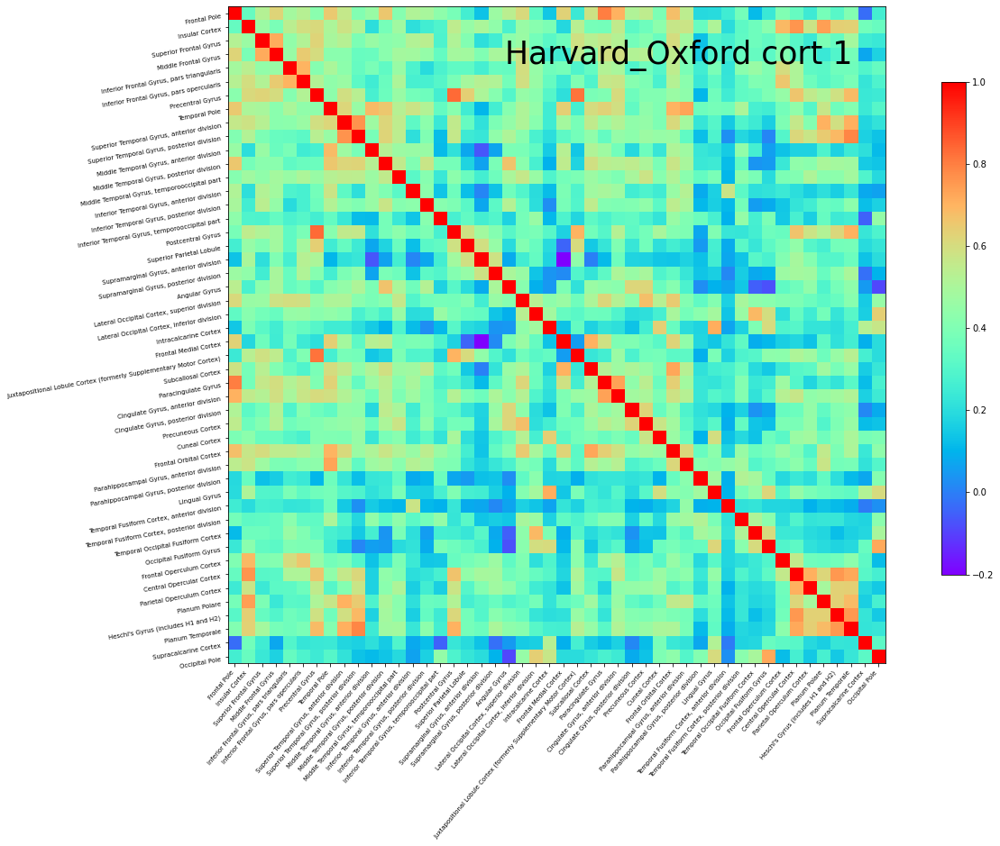

In [1250]:
plot_correlation(atlas_types, data_df, 'harvard_oxford_cort_1', 'Harvard_Oxford cort 1', 'rainbow')

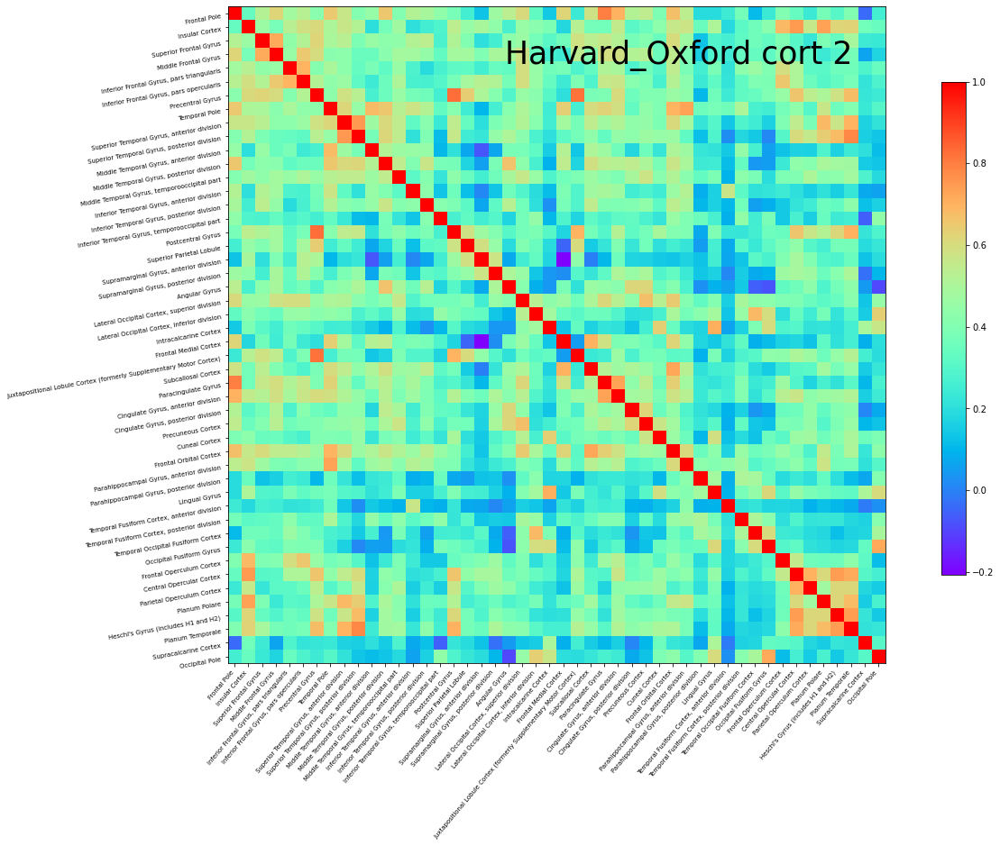

In [1251]:
plot_correlation(atlas_types, data_df, 'harvard_oxford_cort_2', 'Harvard_Oxford cort 2', 'rainbow')

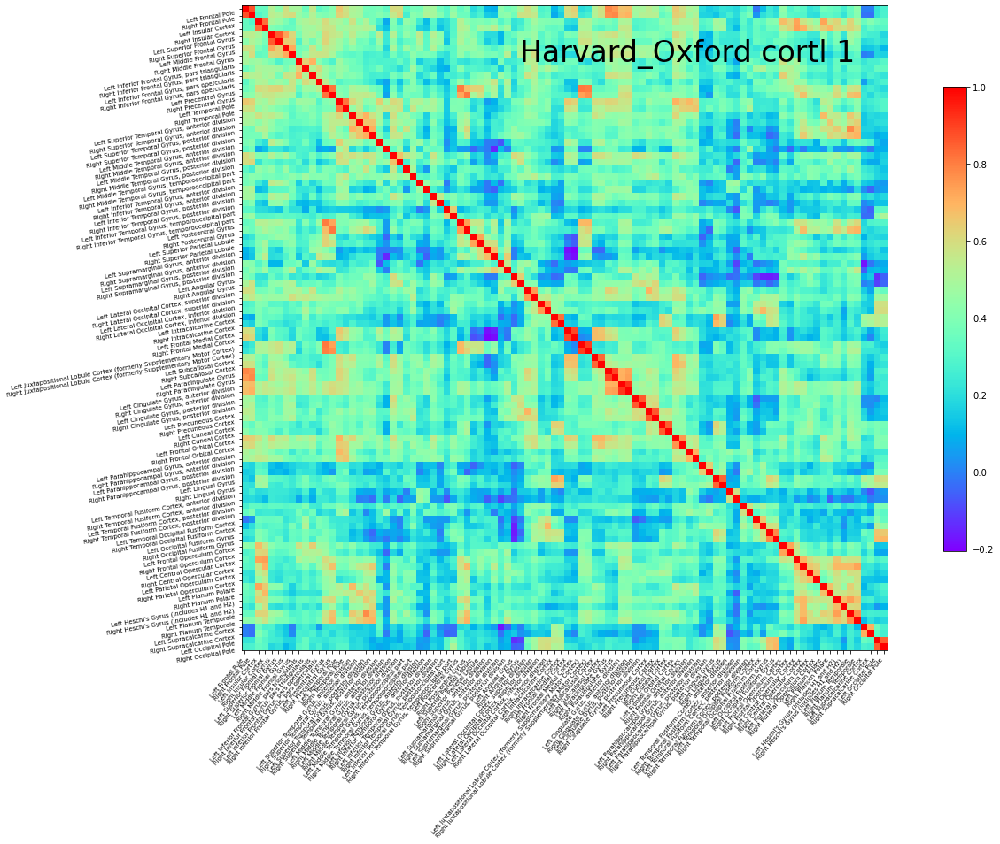

In [1252]:
plot_correlation(atlas_types, data_df, 'harvard_oxford_cortl_1', 'Harvard_Oxford cortl 1', 'rainbow')

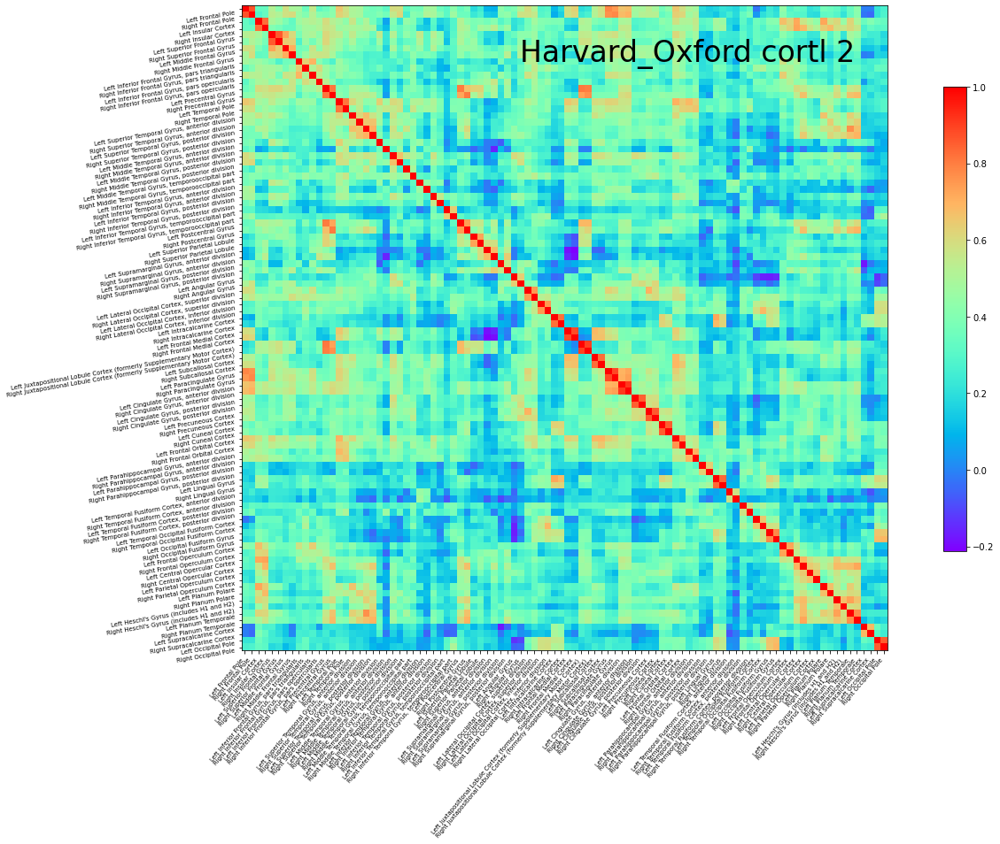

In [1253]:
plot_correlation(atlas_types, data_df, 'harvard_oxford_cortl_2', 'Harvard_Oxford cortl 2', 'rainbow')

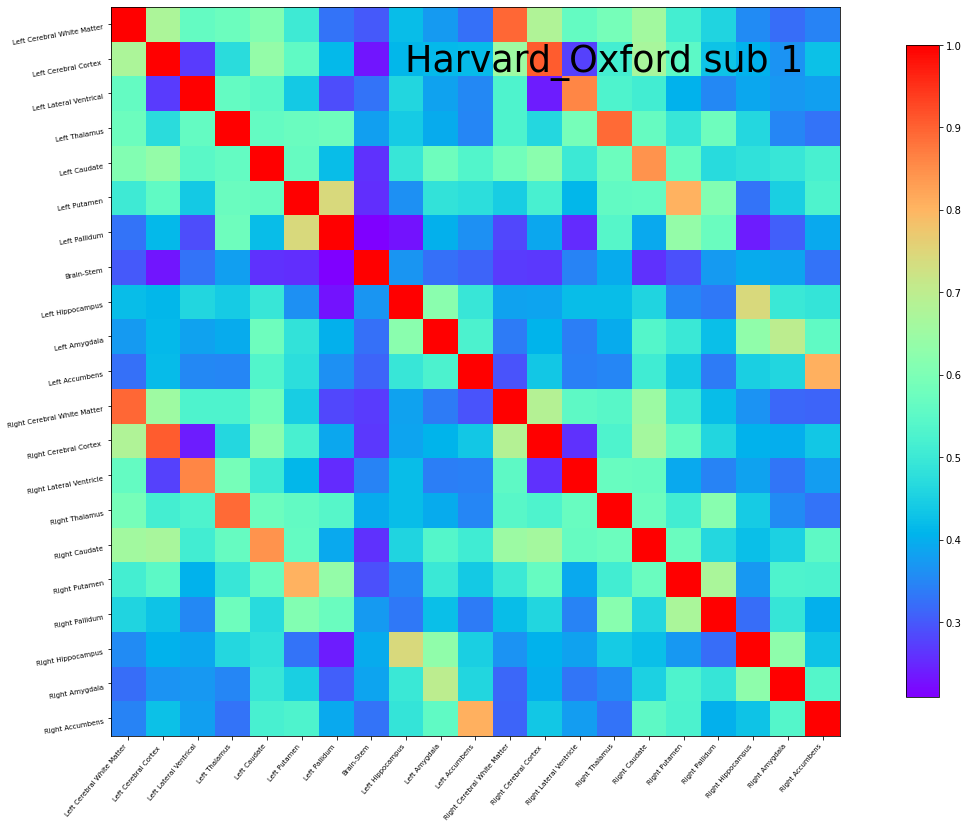

In [1254]:
plot_correlation(atlas_types, data_df, 'harvard_oxford_sub_1', 'Harvard_Oxford sub 1', 'rainbow')

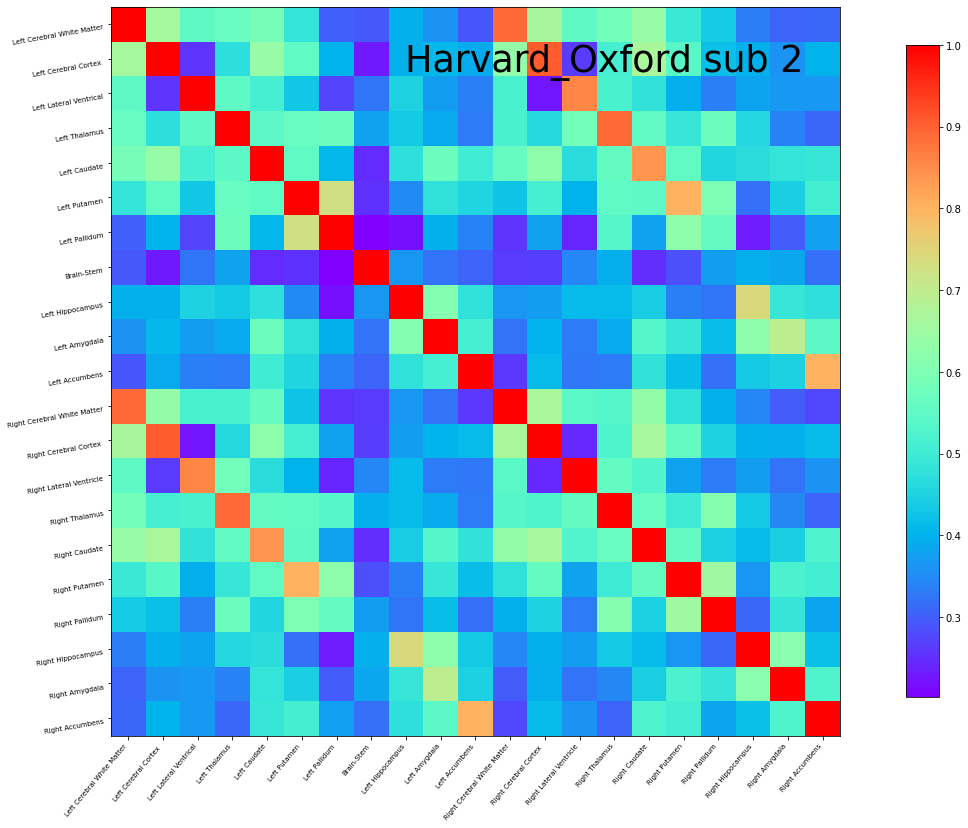

In [1255]:
plot_correlation(atlas_types, data_df, 'harvard_oxford_sub_2', 'Harvard_Oxford sub 2', 'rainbow')

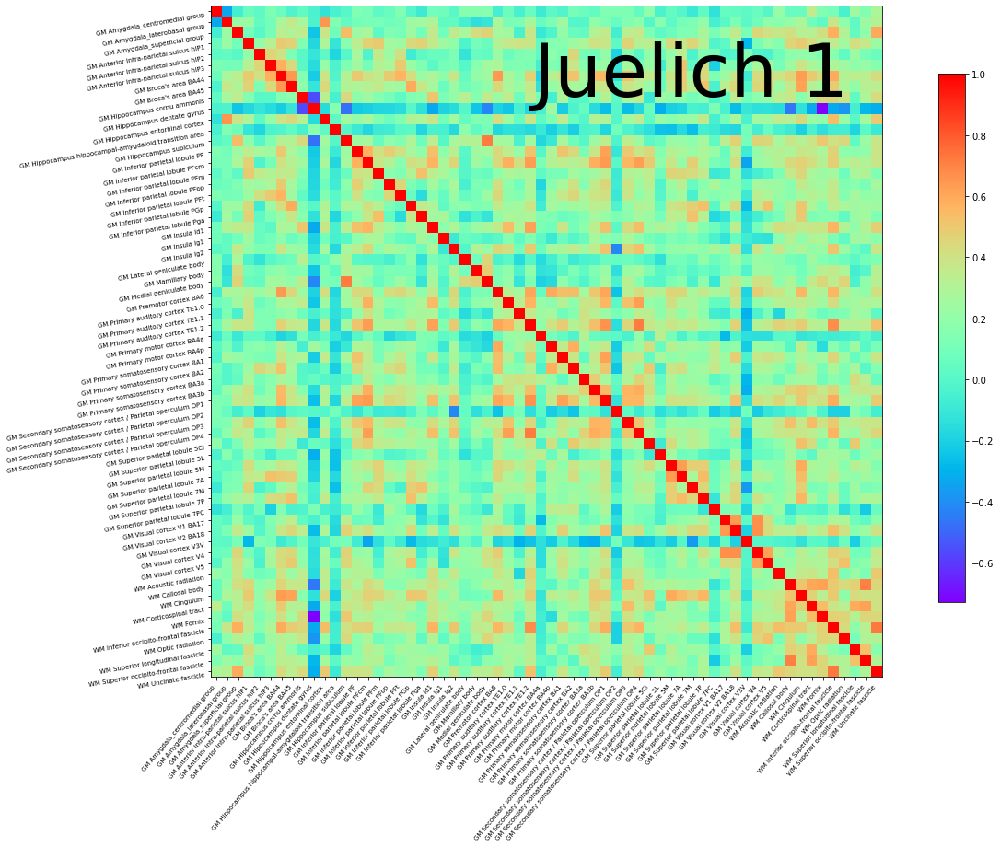

In [1256]:
plot_correlation(atlas_types, data_df, 'juelich_1', 'Juelich 1', 'rainbow')

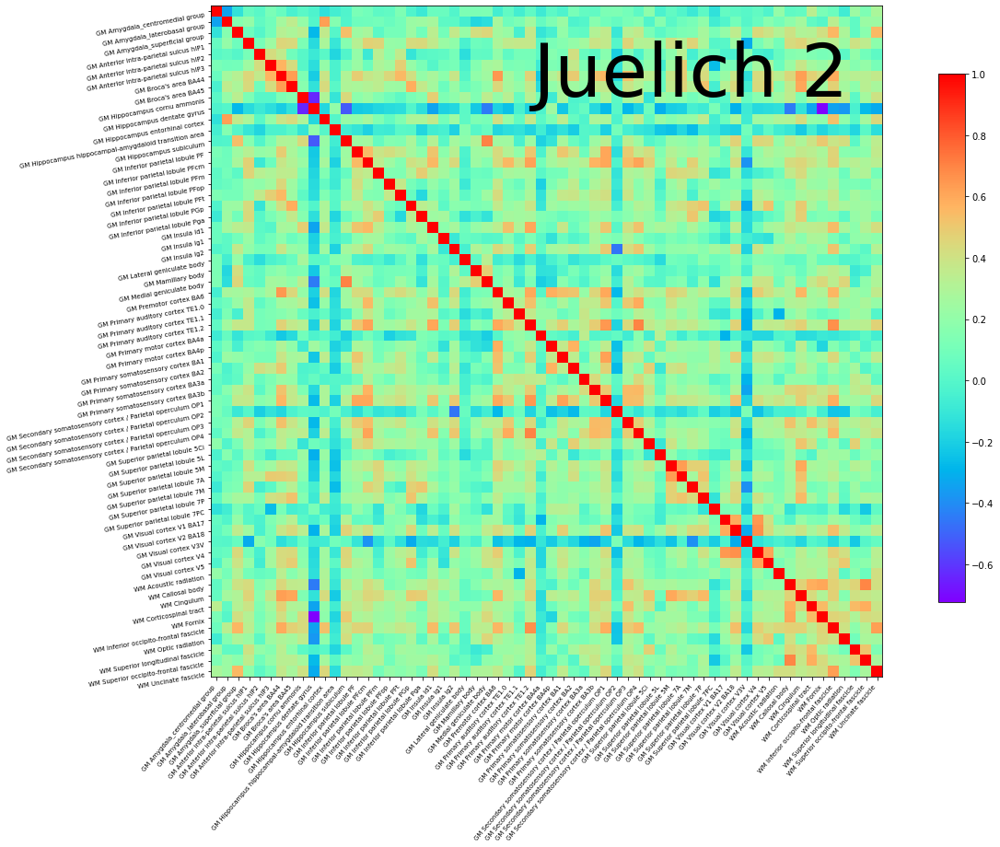

In [1257]:
plot_correlation(atlas_types, data_df, 'juelich_2', 'Juelich 2', 'rainbow')

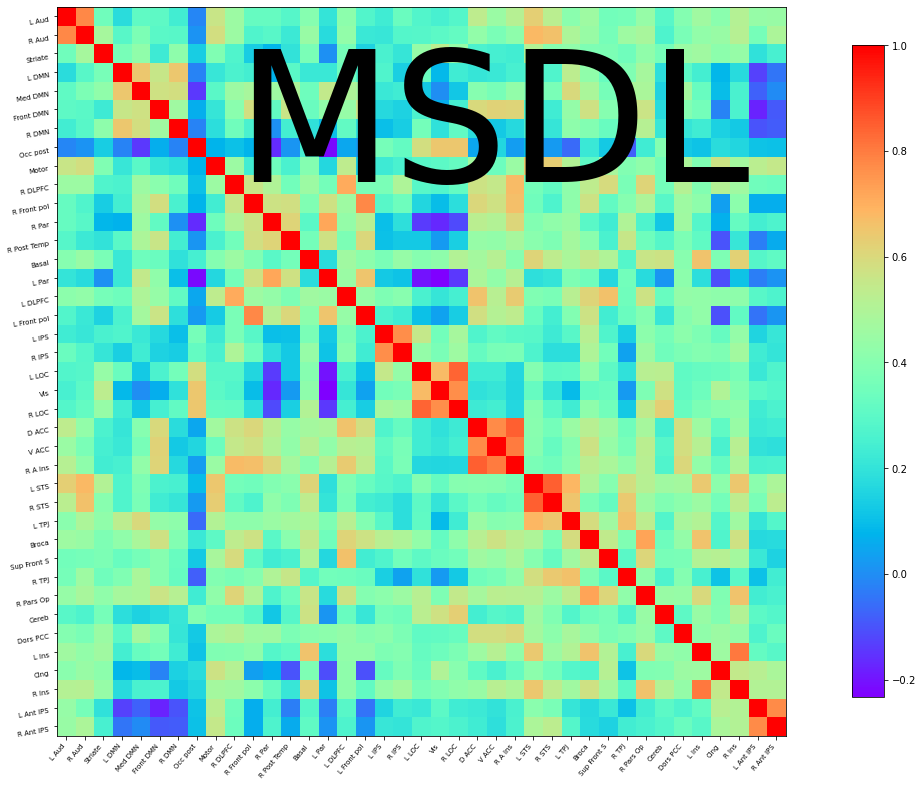

In [1258]:
plot_correlation(atlas_types, data_df, 'msdl', 'MSDL', 'rainbow')

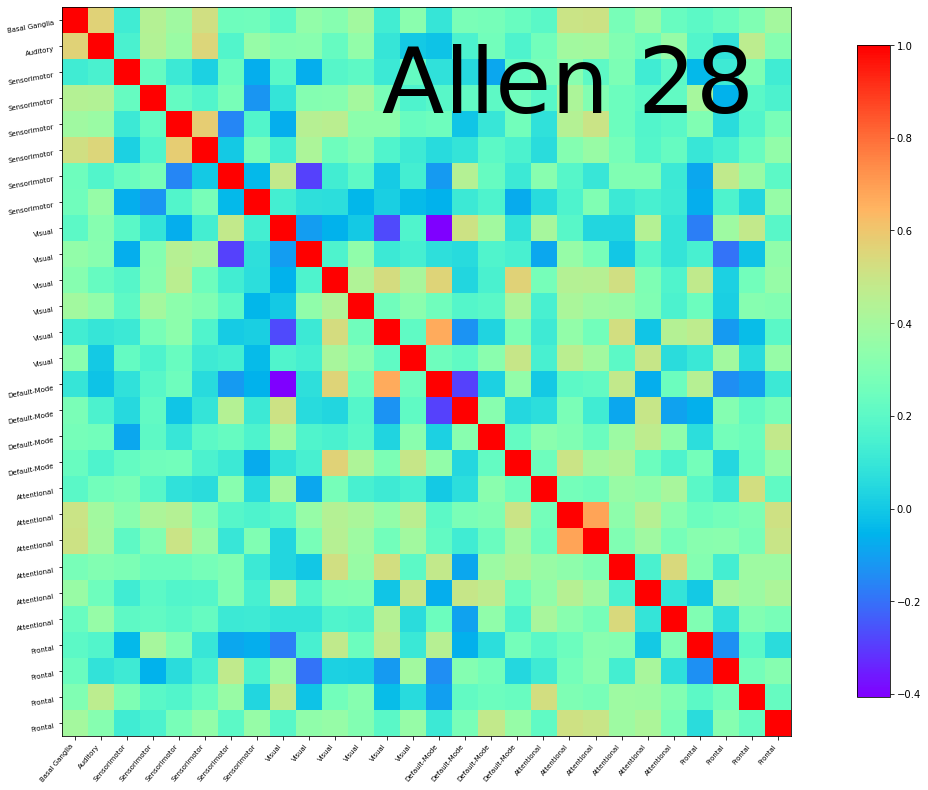

In [1259]:
plot_correlation(atlas_types, data_df, 'allen_28', 'Allen 28', 'rainbow')

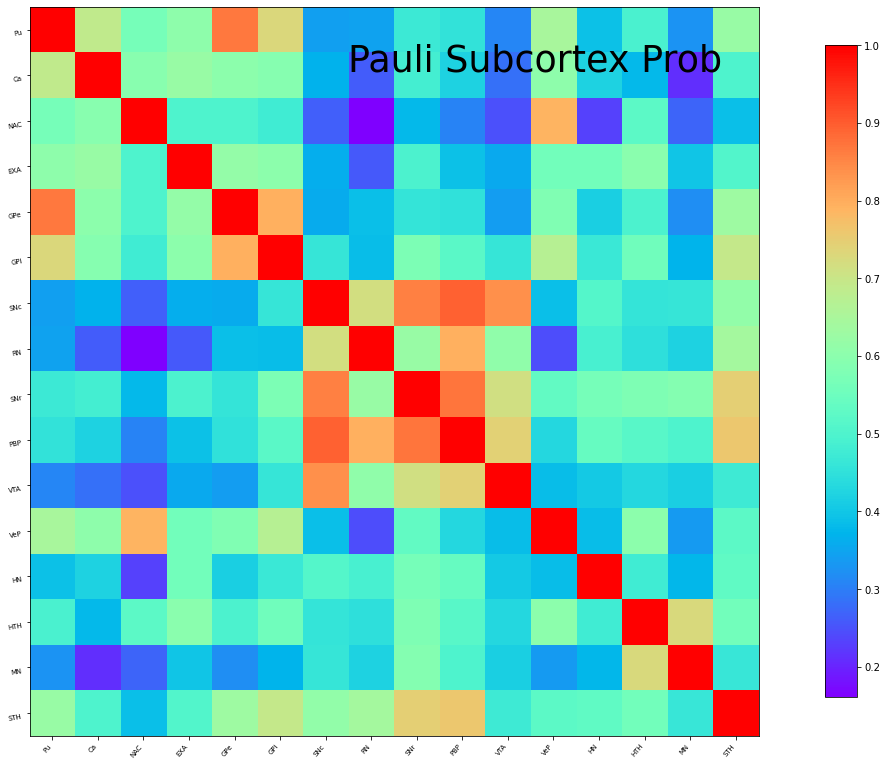

In [1260]:
plot_correlation(atlas_types, data_df, 'pauli_subcortex_prob', 'Pauli Subcortex Prob', 'rainbow')

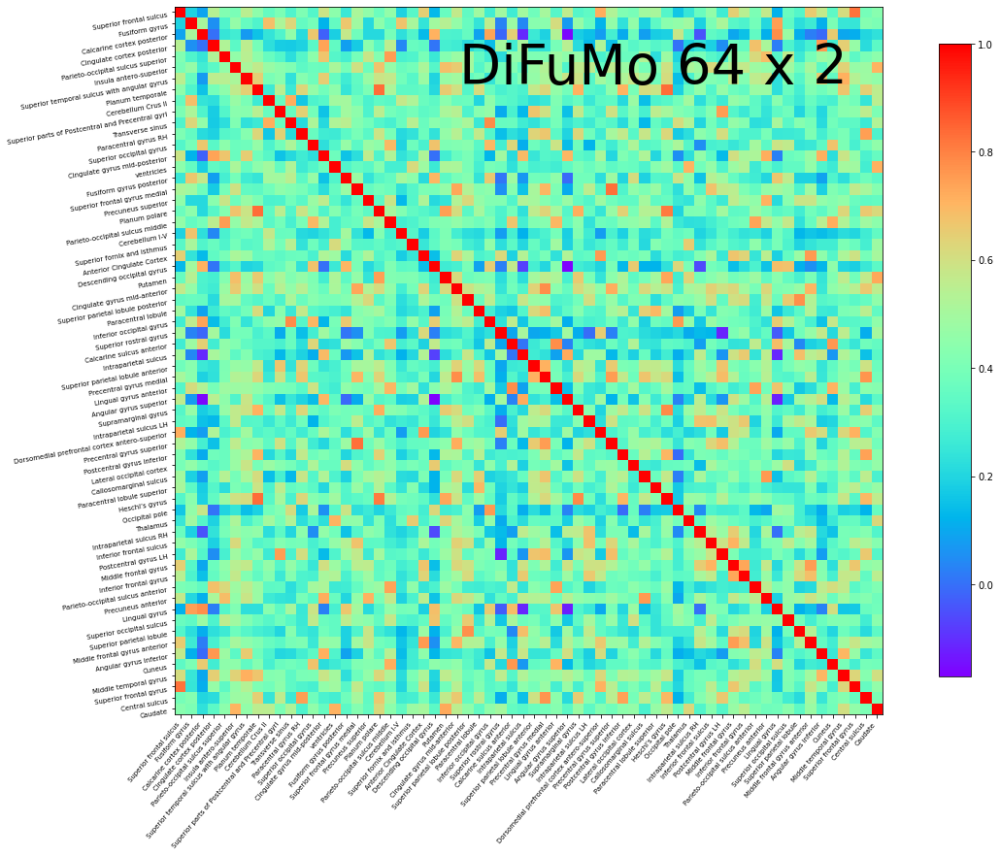

In [1261]:
plot_correlation(atlas_types, data_df, 'difumo_64_2', 'DiFuMo 64 x 2', 'rainbow')

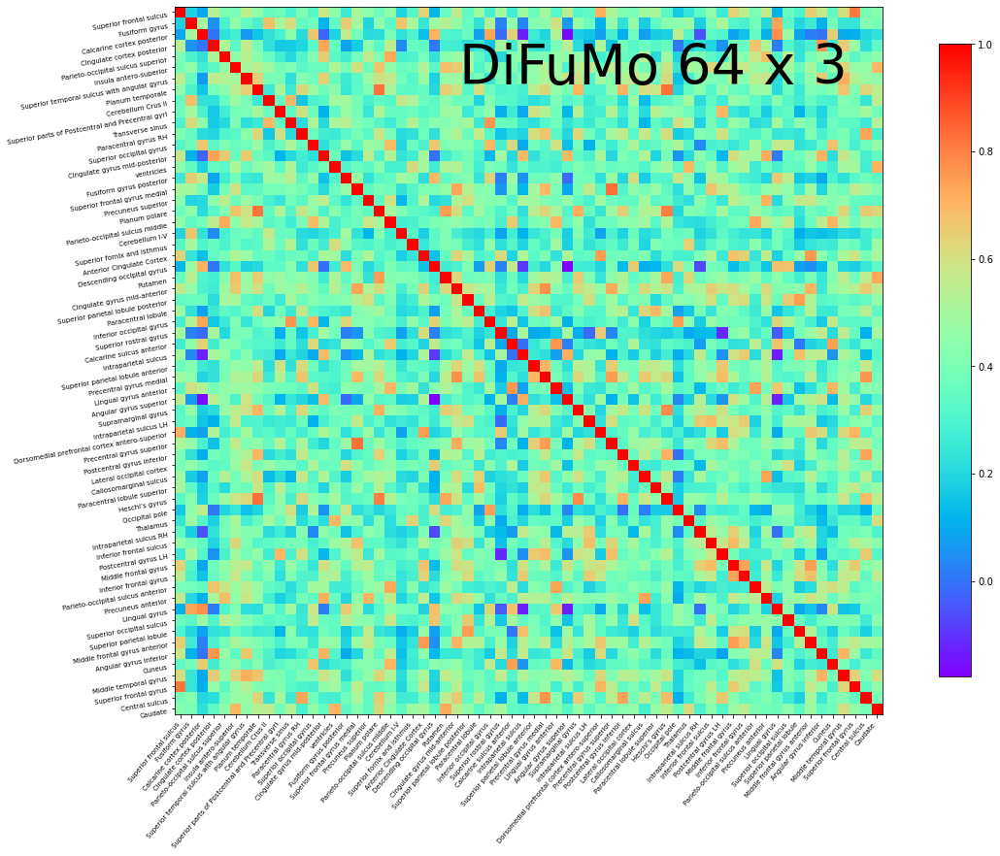

In [1262]:
plot_correlation(atlas_types, data_df, 'difumo_64_3', 'DiFuMo 64 x 3', 'rainbow')

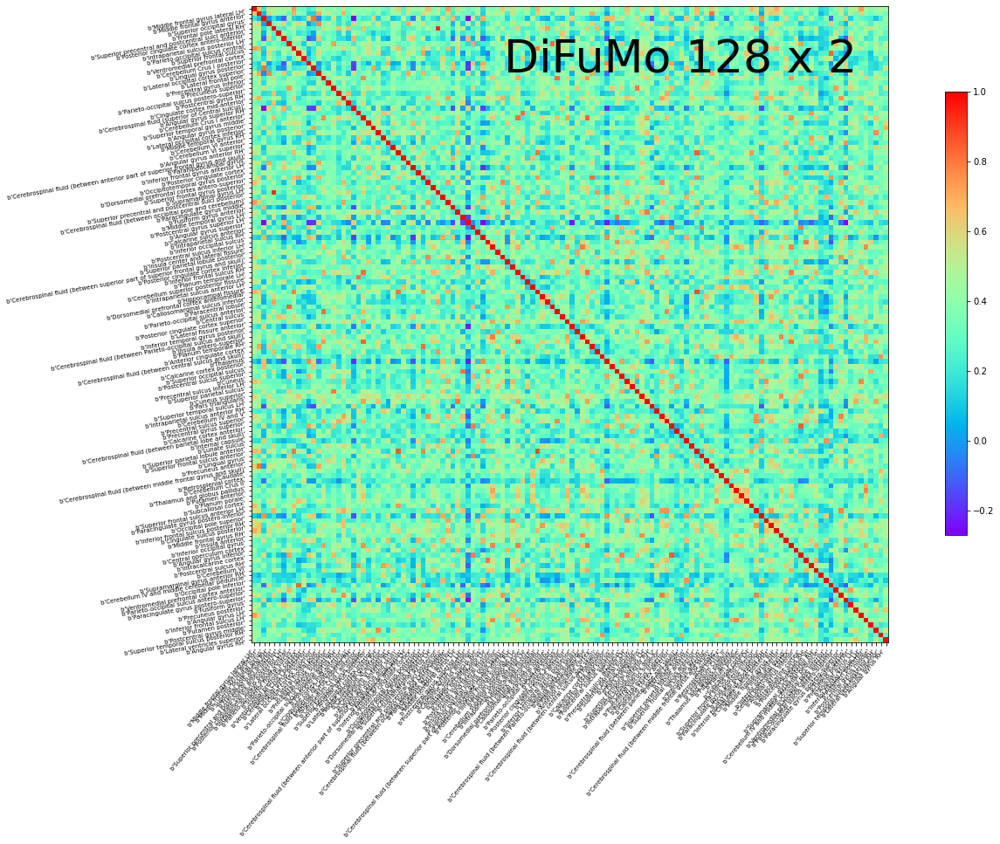

In [1263]:
plot_correlation(atlas_types, data_df, 'difumo_128_2', 'DiFuMo 128 x 2', 'rainbow')

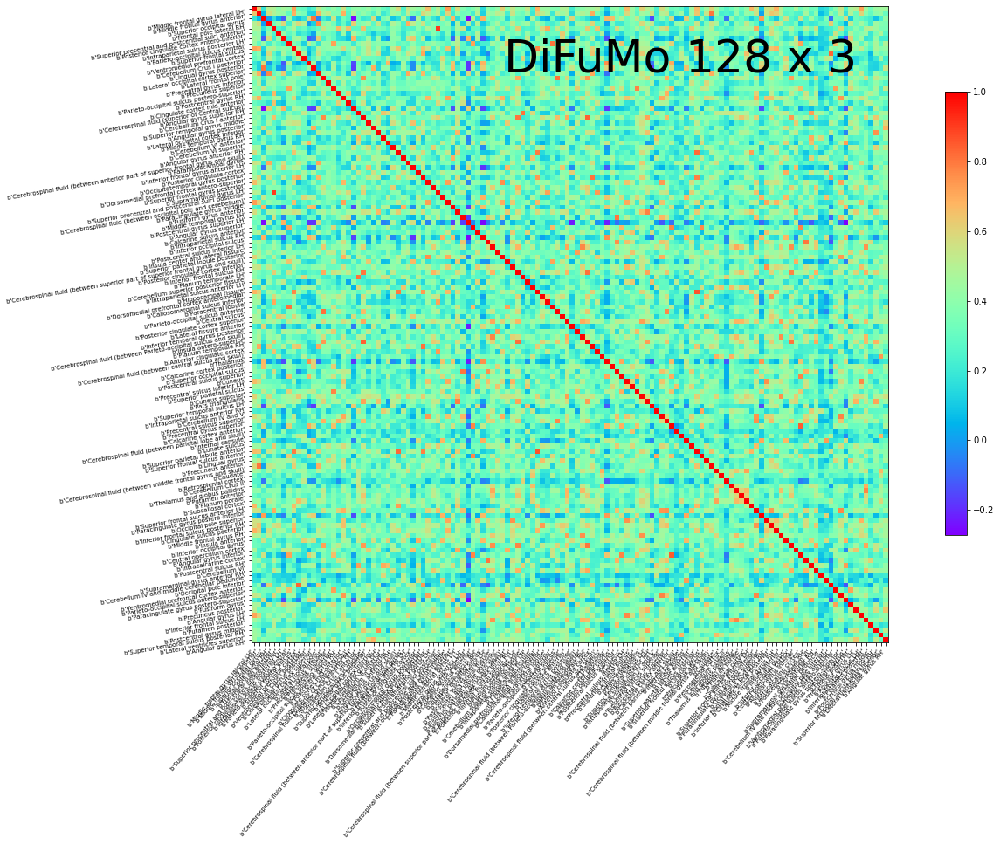

In [1264]:
plot_correlation(atlas_types, data_df, 'difumo_128_3', 'DiFuMo 128 x 3', 'rainbow')

Difumo 256 x 2, Difumo 256 x 3, Difumo 512 x 2, Difumo 512 x 3, Difumo 1024 x 2 and Difumo 1024 x 3 were not included in the correlation matrix visualizations because there are too many labels and the visualization was illegible. 

# NEXT STEPS

As this is an ongoing project I do have code in the works to expand this project. In term of visualizations I plan to work on the following:
* `heatmap` showing metrics for each emotion state, priming state, parcellation technique and algorithm
* `ROC Curve Graph` for each classifiers performance
* `Scatter plot` for parcellations, algorithms and primings
* ` Counts Plot` for frequency of parcellations, algorithms and primings in specific ranges
* `Pairplot` grouping hues



In terms of expanding the code and creating more` dataframes` I have created a function that turns a `brain image` into a condensed `vector` without using a `parcellation atlas` and want to test how `vector length` with this technique affects the algorithms. I also would love to explore the `optimal k` value for each `classifier` using `KNN`; I used `K=5` for the data you see above. I'd also explore how different `train` and `test` sizes affect the `sklearn classifiers` as those were more low performing than my hand-made `KNN` classifiers were. For the plot `correlation matrices` I am working on a function that outputs the areas of the brain most correlated (either above a specific score or the top n (n being a number) `correlation` pairs.

# SOURCES

https://identifiers.org/neurovault.collection:262